In [1]:
import torch
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import os
import trimesh
from sklearn.model_selection import train_test_split

random_state=42
np.random.seed(random_state)

In [2]:
#Stockage des modèles 3D

data_path = './data'
model_files = os.listdir(data_path)

models = []
for file in model_files:
    model = trimesh.load(os.path.join(data_path, file))
    models.append(model)
print(f'Nombre de modèles 3D chargés : {len(models)}')

Nombre de modèles 3D chargés : 24


In [3]:
#Affichage d'un modèle 3D
models[0].show()

In [4]:
#Concaténation des coodonnées des sommets de tous les modèles (N_modèles, N_sommets *3)
X = np.vstack([model.vertices.flatten() for model in models])
print(f'Forme des coordonnées des sommets concaténés : {X.shape}')

Forme des coordonnées des sommets concaténés : (24, 54873)


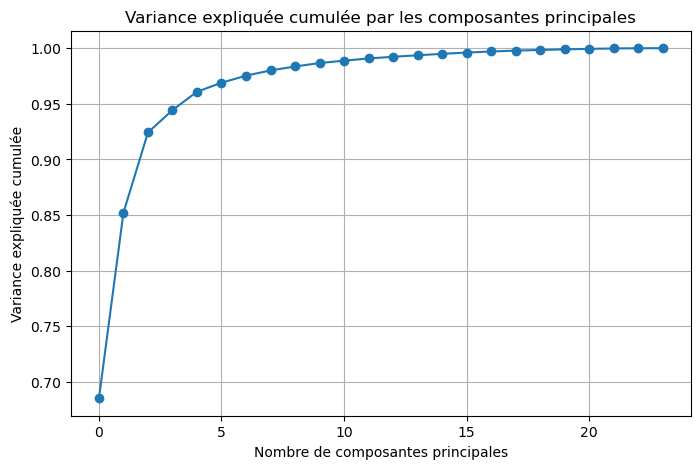

In [5]:
#PCA X
pca = PCA()
pca.fit(X)

#Tracé de la variance expliquée cumulée
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(8, 5))
plt.plot(explained_variance, marker='o')
plt.title('Variance expliquée cumulée par les composantes principales')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.grid()
plt.show()

In [6]:
#Masking aléatoire des faces
def mask_model(model, missing_rate=0.3):
    num_vertices = model.vertices.shape[0]
    num_missing = int(num_vertices * missing_rate)
    
    missing_indices = np.random.choice(num_vertices, num_missing, replace=False)
    
    masked_vertices = model.vertices.copy()
    masked_vertices[missing_indices] = np.nan
  
    return masked_vertices

In [7]:
def Iterative_PCA(X_masked, X_true, n_components, max_iter=100, tol=1e-4, verbose=False):
    X_filled = X_masked.copy()

    #Normalize error list
    errors_obs = []
    errors_miss = []
    errors = []
    
    # Initialisation : remplacer les NaN par la moyenne de chaque colonne
    col_means = np.nanmean(X_filled, axis=0)
    inds = np.where(np.isnan(X_filled))
    X_filled[inds] = np.take(col_means, inds[1])
    
    for iteration in range(max_iter):
        pca = PCA(n_components=n_components)
        X_reduced = pca.fit_transform(X_filled)
        X_reconstructed = pca.inverse_transform(X_reduced)
        
        # Mise à jour des valeurs manquantes
        X_new = X_filled.copy()
        X_new[inds] = X_reconstructed[inds]
        
        # Vérification de la convergence
        if np.linalg.norm(X_new - X_filled) < tol:
            print(f"Converged at iteration {iteration + 1}")
            break
        
        X_filled = X_new
        err_obs = np.linalg.norm(X_reconstructed[~np.isnan(X_masked)] - X_true[~np.isnan(X_masked)])/sum(sum(~np.isnan(X_masked)))
        errors_obs.append(err_obs)
        err_miss = np.linalg.norm(X_reconstructed[inds] - X_true[inds])/sum(sum(np.isnan(X_masked)))   
        errors_miss.append(err_miss)
        err = np.linalg.norm(X_filled - X_true)/(X_true.shape[0]*X_true.shape[1])
        errors.append(err)
        if verbose and iteration % 50 == 0:
            print(f"Iteration {iteration + 1}, error on observed: {err_obs}")
            print(f"Iteration {iteration + 1}, error on missing: {err_miss}")
            print(f"Iteration {iteration + 1}, total error: {err}")


    
    return X_filled, errors_obs, errors_miss, errors

In [ ]:
K = 11

In [9]:
masked_vertices_list = [mask_model(model, missing_rate=0.5) for model in models]
X_masked = np.array([masked_vertices.flatten() for masked_vertices in masked_vertices_list])

In [10]:
X_imputed, errors_obs, errors_miss, errors = Iterative_PCA(X_masked, X, n_components=K, max_iter=300, tol=1e-4)

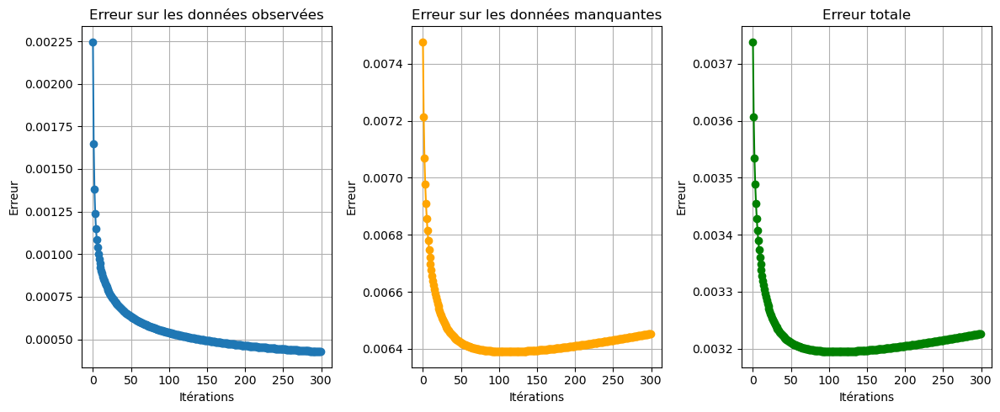

In [11]:
#Affichage des erreurs au cours des itérations
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.plot(errors_obs, marker='o')
plt.title('Erreur sur les données observées')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(errors_miss, marker='o', color='orange')
plt.title('Erreur sur les données manquantes')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(errors, marker='o', color='green')
plt.title('Erreur totale')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()
plt.tight_layout()
plt.show()

In [12]:
max_iter= np.argmin(errors)
print(f'Nombre d\'itérations optimal : {max_iter}')

Nombre d'itérations optimal : 111


In [13]:
X_imputed, errors_obs, errors_miss, errors = Iterative_PCA(X_masked, X, n_components=K, max_iter=max_iter, tol=1e-4)

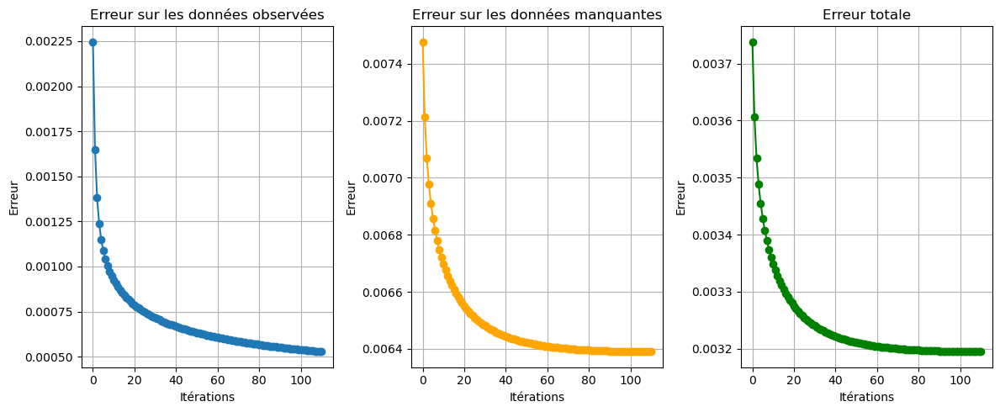

In [14]:
#Affichage des erreurs au cours des itérations
plt.figure(figsize=(12, 5))
plt.subplot(1, 3, 1)
plt.plot(errors_obs, marker='o')
plt.title('Erreur sur les données observées')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(errors_miss, marker='o', color='orange')
plt.title('Erreur sur les données manquantes')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(errors, marker='o', color='green')
plt.title('Erreur totale')
plt.xlabel('Itérations')
plt.ylabel('Erreur')
plt.grid()
plt.tight_layout()
plt.show()

In [15]:
#Affichage des meshes avant et après imputation
model_index = 0  # Index du modèle à afficher
original_model = models[model_index]
masked_vertices = X_masked[model_index].reshape(-1, 3)
imputed_vertices = X_imputed[model_index].reshape(-1, 3)

original_mesh = trimesh.Trimesh(vertices=original_model.vertices, faces=original_model.faces)
imputed_mesh = trimesh.Trimesh(vertices=imputed_vertices, faces=original_model.faces)
original_mesh.show()

In [16]:
mask = ~np.isnan(masked_vertices).any(axis=1)

# Conserver les faces dont les 3 vertices sont valides
masked_faces = original_model.faces[np.all(mask[original_model.faces], axis=1)]

total_faces = original_model.faces.shape[0]
print(f'Nombre total de faces : {total_faces}')
print(f'Nombre de faces valides après masquage : {masked_faces.shape[0]}')
print(f'Pourcentage de faces valides après masquage : {masked_faces.shape[0]/total_faces*100:.2f}%')

masked_mesh = trimesh.Trimesh(
    vertices=masked_vertices,
    faces=masked_faces
)

masked_mesh.show()

Nombre total de faces : 36578
Nombre de faces valides après masquage : 4625
Pourcentage de faces valides après masquage : 12.64%


In [17]:
imputed_mesh.show()

In [18]:
#Séparation train/test
models_train, models_test = train_test_split(models, test_size=0.2, random_state=random_state)

#Séparation train/validation
models_train, models_val = train_test_split(models_train, test_size=0.2, random_state=random_state)

X_train = np.array([model.vertices.flatten() for model in models_train])
X_val = np.array([model.vertices.flatten() for model in models_val])
X_test = np.array([model.vertices.flatten() for model in models_test])

In [19]:
#Masquage des données

masked_vertices_list = [mask_model(model, missing_rate=0.5) for model in models_train]
X_train_masked = np.array([masked_vertices.flatten() for masked_vertices in masked_vertices_list])

masked_vertices_list = [mask_model(model, missing_rate=0.5) for model in models_val]
X_val_masked = np.array([masked_vertices.flatten() for masked_vertices in masked_vertices_list])

masked_vertices_list = [mask_model(model, missing_rate=0.95) for model in models_test]
X_test_masked = np.array([masked_vertices.flatten() for masked_vertices in masked_vertices_list])

#Mise à 0 des NaN pour l'autoencodeur
X_train_masked = np.nan_to_num(X_train_masked, nan=0.0)
X_test_masked = np.nan_to_num(X_test_masked, nan=0.0)
X_val_masked = np.nan_to_num(X_val_masked, nan=0.0)

#tenseur données
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)

#tenseur données masquées
X_train_masked_tensor = torch.tensor(X_train_masked, dtype=torch.float32)
X_test_masked_tensor = torch.tensor(X_test_masked, dtype=torch.float32)
X_val_masked_tensor = torch.tensor(X_val_masked, dtype=torch.float32)

In [20]:
#Autoencodeur
class Autoencoder(torch.nn.Module):
    def __init__(self, input_dim, hidden_dims):
        super(Autoencoder, self).__init__()
        # Encoder
        encoder_layers = []
        prev_dim = input_dim
        for h_dim in hidden_dims:
            encoder_layers.append(torch.nn.Linear(prev_dim, h_dim))
            encoder_layers.append(torch.nn.ReLU())
            prev_dim = h_dim
        self.encoder = torch.nn.Sequential(*encoder_layers)
        
        # Decoder
        decoder_layers = []
        hidden_dims.reverse()
        for h_dim in hidden_dims[1:]:
            decoder_layers.append(torch.nn.Linear(prev_dim, h_dim))
            decoder_layers.append(torch.nn.ReLU())
            prev_dim = h_dim
        decoder_layers.append(torch.nn.Linear(prev_dim, input_dim))
        self.decoder = torch.nn.Sequential(*decoder_layers)
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [21]:
#Paramètres de l'autoencodeur
input_dim = X_train.shape[1]
hidden_dims = [512, 256, 128, 64]
model = Autoencoder(input_dim, hidden_dims)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = torch.nn.MSELoss()
num_epochs = 1000
Early_stopping_patience = 10

In [22]:
best_loss = float('inf')
patience_counter = 0
train_losses = []
val_losses = []
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_masked_tensor)
    loss = criterion(outputs, X_train_tensor)
    train_losses.append(loss.item())
    loss.backward()
    optimizer.step()
    
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_masked_tensor)
        val_loss = criterion(val_outputs, X_val_tensor)
    val_losses.append(val_loss.item())
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}')
    
    # Early stopping
    if val_loss.item() < best_loss:
        best_loss = val_loss.item()
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= Early_stopping_patience:
            print("Early stopping triggered")
            break

Epoch [1/1000], Loss: 7831.3901, Val Loss: 7791.0381
Epoch [2/1000], Loss: 7327.2944, Val Loss: 6447.0283
Epoch [3/1000], Loss: 6098.7388, Val Loss: 5131.4771
Epoch [4/1000], Loss: 4806.2095, Val Loss: 2932.7488
Epoch [5/1000], Loss: 2750.6118, Val Loss: 4260.6797
Epoch [6/1000], Loss: 4115.7881, Val Loss: 1048.3309
Epoch [7/1000], Loss: 964.3215, Val Loss: 1933.8151
Epoch [8/1000], Loss: 1770.6731, Val Loss: 2095.3235
Epoch [9/1000], Loss: 1921.7042, Val Loss: 1351.4514
Epoch [10/1000], Loss: 1233.4966, Val Loss: 786.8960
Epoch [11/1000], Loss: 737.2126, Val Loss: 1562.5675
Epoch [12/1000], Loss: 1517.4729, Val Loss: 951.6454
Epoch [13/1000], Loss: 922.3093, Val Loss: 473.2230
Epoch [14/1000], Loss: 436.3183, Val Loss: 761.0211
Epoch [15/1000], Loss: 690.5079, Val Loss: 860.7935
Epoch [16/1000], Loss: 783.5725, Val Loss: 579.2813
Epoch [17/1000], Loss: 527.1003, Val Loss: 329.1953
Epoch [18/1000], Loss: 310.6997, Val Loss: 527.9164
Epoch [19/1000], Loss: 521.1246, Val Loss: 510.4073
E

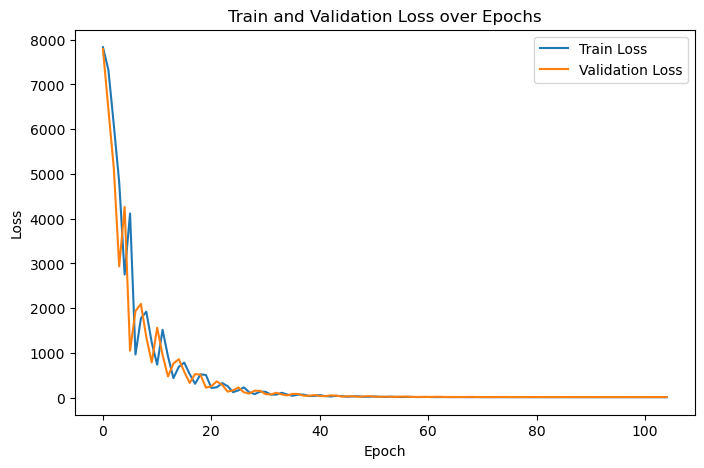

In [23]:
#Affichage des losses d'entraînement et de validation
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Validation Loss over Epochs')
plt.legend()
plt.show()

In [24]:
#Inférence sur le jeu de test
model.eval()
with torch.no_grad():
    test_outputs = model(X_test_masked_tensor)
    test_loss = criterion(test_outputs, X_test_tensor)
print(f'Test Loss: {test_loss.item():.4f}')

Test Loss: 6605.2700


In [25]:
#Indicde du modèle du jeu de test avec la plus grande erreur
test_errors = torch.norm(test_outputs - X_test_tensor, dim=1)
max_error_index = torch.argmax(test_errors).item()
print(f'Index du modèle du jeu de test avec la plus grande erreur : {max_error_index}')

Index du modèle du jeu de test avec la plus grande erreur : 2


In [26]:
#Affichage des meshes avant et après imputation avec l'autoencodeur (test)
model_index = 2  # Index du modèle à afficher
original_model = models[model_index]
masked_vertices = X_test_masked[model_index].reshape(-1, 3)
imputed_vertices = test_outputs[model_index].numpy().reshape(-1, 3)
original_mesh = trimesh.Trimesh(vertices=original_model.vertices, faces=original_model.faces)
imputed_mesh = trimesh.Trimesh(vertices=imputed_vertices, faces=original_model.faces)

In [27]:
original_mesh.show()

In [28]:
vertex_mask = ~(np.all(masked_vertices == 0, axis=1))  # True = vertex “valide”

# Conserver les faces dont les 3 vertices sont valides
masked_faces = original_model.faces[np.all(vertex_mask[original_model.faces], axis=1)]

total_faces = original_model.faces.shape[0]
print(f'Nombre total de faces : {total_faces}')
print(f'Nombre de faces valides après masquage : {masked_faces.shape[0]}')
print(f'Pourcentage de faces valides après masquage : {masked_faces.shape[0]/total_faces*100:.2f}%')

masked_mesh = trimesh.Trimesh(
    vertices=original_model.vertices,
    faces=masked_faces
)

masked_mesh.show()

Nombre total de faces : 36578
Nombre de faces valides après masquage : 7
Pourcentage de faces valides après masquage : 0.02%


In [29]:
imputed_mesh.show()